<a href="https://colab.research.google.com/github/ssandanshi/Super-Resolution-GAN/blob/master/Final_Neural_Network_F2_Baseline_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:

from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
try:
  %tensorflow_version 2.x
except Exception:
  pass

TensorFlow 2.x selected.


In [0]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import pandas as pd
import pickle
import time

#Data Generator
import tensorflow as tf
from tensorflow.python.data.experimental import AUTOTUNE

#Model/Trainer
from tensorflow.keras.applications.vgg19 import preprocess_input, VGG19
from tensorflow.keras.losses import BinaryCrossentropy, MeanSquaredError, MeanAbsoluteError
from tensorflow.keras.metrics import Mean
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Activation, Add, BatchNormalization, Conv2D, Dense, Flatten, Input, LeakyReLU, PReLU, Lambda
from tensorflow.keras.models import Model

#Predict
from google.colab import files
from PIL import Image

# Data Generator

In [0]:

def dataset(subset='train',images_dir='data/images',caches_dir='data/cache',batch_size=16, repeat_times=None, random_transform=True):
    if subset == 'train':
        image_list = range(1, 801)
    elif subset == 'valid':
        image_list = range(801, 901)
    else:
        raise Exception('Invalid subset name')

    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(caches_dir, exist_ok=True)
    hr_dir = images_dir+"/"+'DIV2K_'+subset+'_HR'
    lr_dir = images_dir+"/"+'DIV2K_'+subset+'_LR_unknown/X4'

    lr_ds = get_data(subset,lr_dir,"LR",image_list,caches_dir)
    hr_ds = get_data(subset,hr_dir,"HR",image_list,caches_dir)
    #print(type(lr_ds),type(hr_ds),lr_ds)
    ds = tf.data.Dataset.zip((lr_ds, hr_ds))
    if random_transform:
        ds = ds.map(lambda lr, hr: generate_cropped_image(lr, hr), num_parallel_calls=AUTOTUNE)
        ds = ds.map(random_rotate, num_parallel_calls=AUTOTUNE)
        ds = ds.map(random_flip, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch_size)
    ds = ds.repeat(repeat_times)
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds

In [0]:
def get_data(subset,directory,res,image_list,caches_dir):
    if res == "HR":
        cache_file = os.path.join(caches_dir, f'DIV2K_{subset}_HR.cache')
        cache_index = f'{cache_file}.index'
        archive_file = 'DIV2K_'+subset+'_HR.zip'
        image_dir_list = [os.path.join(directory, f'{image_id:04}.png') for image_id in image_list]
    else:
        cache_file = os.path.join(caches_dir, f'DIV2K_{subset}_LR_unknown_X4.cache')
        cache_index = f'{cache_file}.index'
        archive_file = 'DIV2K_'+subset+'_LR_unknown_X4.zip'
        image_dir_list = [os.path.join(directory, f'{image_id:04}x4.png') for image_id in image_list]

    if not os.path.exists(directory):
        download_data(archive_file, 'data/images')
    
    ds = tf.data.Dataset.from_tensor_slices(image_dir_list)
    ds = ds.map(tf.io.read_file)
    ds = ds.map(lambda x: tf.image.decode_png(x, channels=3), num_parallel_calls=AUTOTUNE)
    ds = ds.cache(cache_file)

    if not os.path.exists(cache_index):
        populate_cache(ds, cache_file)
    
    return ds

In [0]:
def populate_cache(ds, cache_file):
        print(f'Caching decoded images in {cache_file} ...')
        for _ in ds: pass
        print(f'Cached decoded images in {cache_file}.')

def download_data(file, target_dir):
    source_url = f'http://data.vision.ee.ethz.ch/cvl/DIV2K/{file}'
    target_dir = os.path.abspath(target_dir)
    print(target_dir)
    tf.keras.utils.get_file(file, source_url, cache_subdir=target_dir, extract=True)
    os.remove(os.path.join(target_dir, file))    

### Data Augmentation

In [0]:
def generate_cropped_image(lr_img, hr_img, crop_hr_dim=96):
    crop_lr_dim = int(crop_hr_dim/4)
    lr_img_shape = tf.shape(lr_img)[:2]

    #Generate random numbers in x and y to start the crop
    rand_x = tf.random.uniform(shape=(), maxval=lr_img_shape[1] - crop_lr_dim + 1, dtype=tf.int32)
    rand_y = tf.random.uniform(shape=(), maxval=lr_img_shape[0] - crop_lr_dim + 1, dtype=tf.int32)

    #Corresponding cell in high resolution
    hr_x = rand_x * 4
    hr_y = rand_y * 4

    cropped_lr = lr_img[rand_y:rand_y + crop_lr_dim, rand_x:rand_x + crop_lr_dim]
    cropped_hr = hr_img[hr_y:hr_y + crop_hr_dim, hr_x:hr_x + crop_hr_dim]

    return cropped_lr, cropped_hr

#Mirror image horizontally randomly
def random_flip(lr_img, hr_img):
    #Generate a random number
    rn = tf.random.uniform(shape=(), maxval=1)
    #If random number more than 0.5, flip
    return tf.cond(rn < 0.5,
                    lambda: (lr_img, hr_img),
                    lambda: (tf.image.flip_left_right(lr_img),
                            tf.image.flip_left_right(hr_img)))

#Generate a random number from 0 and 4. Rotate the image that many times counter clockwise
def random_rotate(lr_img, hr_img):
    rn = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    return tf.image.rot90(lr_img, rn), tf.image.rot90(hr_img, rn)

In [0]:
train_ds = dataset(subset="train",repeat_times=None,random_transform=True)

/content/data/images
208961536/208956781 [==============================] - 12s 0us/step
Caching decoded images in data/cache/DIV2K_train_LR_unknown_X4.cache ...
Cached decoded images in data/cache/DIV2K_train_LR_unknown_X4.cache.
/content/data/images
3530604544/3530603713 [==============================] - 180s 0us/step
Caching decoded images in data/cache/DIV2K_train_HR.cache ...
Cached decoded images in data/cache/DIV2K_train_HR.cache.


In [0]:
valid_ds = dataset(subset="valid",repeat_times=None,random_transform=True)

/content/data/images
26697728/26695095 [==============================] - 2s 0us/step
Caching decoded images in data/cache/DIV2K_valid_LR_unknown_X4.cache ...
Cached decoded images in data/cache/DIV2K_valid_LR_unknown_X4.cache.
/content/data/images
448995328/448993893 [==============================] - 24s 0us/step
Caching decoded images in data/cache/DIV2K_valid_HR.cache ...
Cached decoded images in data/cache/DIV2K_valid_HR.cache.


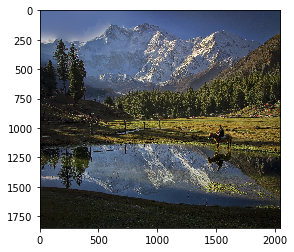

In [0]:
plt.imshow(cv2.imread('data/images/DIV2K_train_HR/0002.png')[...,::-1])

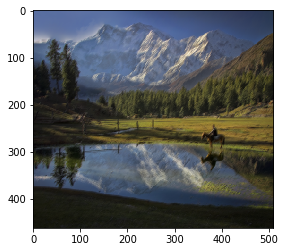

In [0]:
plt.imshow(cv2.imread('data/images/DIV2K_train_LR_unknown/X4/0002x4.png')[...,::-1])

# Evaluation (PSNR)

In [0]:
#Mean of all High Resolution Images for normalization
#source: https://github.com/limbee/NTIRE2017/blob/master/code/tools/stat_DIV2K.lua#L9
HR_RGB_MEAN = np.array([0.4488, 0.4371, 0.4040]) * 255

In [0]:
#super resolution round batch
def super_resolution(model, low_res_batch):
    low_res_batch = tf.cast(low_res_batch, tf.float32)
    #run model to get super resolution images for given low res images
    super_res_batch = model(low_res_batch)
    super_res_batch = tf.clip_by_value(super_res_batch, 0, 255) #make sure within range (0,255)
    super_res_batch = tf.round(super_res_batch)
    super_res_batch = tf.cast(super_res_batch, tf.uint8)
    return super_res_batch

#Find Mean of PSNR on given dataset
def evaluate_psnr(model, dataset):
    psnr_values = []
    for lr, hr in dataset:
        sr = super_resolution(model, lr)
        psnr_value = psnr(hr, sr)[0]
        psnr_values.append(psnr_value)
    return tf.reduce_mean(psnr_values)

In [0]:
#Find Mean of SSIM on given dataset
def evaluate_ssim(model, dataset):
    ssim_values = []
    for lr, hr in dataset:
        sr = super_resolution(model, lr)
        ssim_value = ssim(hr, sr)[0]
        ssim_values.append(ssim_value)
    return tf.reduce_mean(ssim_values)

## Normalizing Input

In [0]:
def normalize(x):
  return (x - HR_RGB_MEAN) / 127.5 #Standardize

def normalize_gan_gen(x):
  return x / 255.0 #Normalizes RGB images to [0, 1]

def normalize_gan_dis(x):
  return x / 127.5 - 1 #Normalizes RGB images to [-1, 1].

def denormalize(x):
  return x * 127.5 + HR_RGB_MEAN
      
def denormalize_gan_gen(x):
  return (x + 1) * 127.5

## Find PSNR

In [0]:
#Evaluate PSNR for 2 images
def psnr(x1, x2):
    return tf.image.psnr(x1, x2, max_val=255)

def psnr2(groundtruth,pred):
  return -10. * np.log10(np.mean(np.square(pred - groundtruth)))
  #return tf.image.psnr(groundtruth, pred, max_val=255)
  #max_pixel = 1.0
  #return (10.0 * K.log((max_pixel ** 2) / (K.mean(K.square(pred - groundtruth), axis=-1)))) / 2.303

In [0]:
def ssim(x1, x2):
    return tf.image.ssim(x1, x2, max_val=255)

In [0]:
#Used for upsampling image
#source: https://github.com/twairball/keras-subpixel-conv
def SubpixelConv2D(input_shape, scale=4):
    """
    Keras layer to do subpixel convolution.
    NOTE: Tensorflow backend only. Uses tf.depth_to_space
    Ref:
        [1] Real-Time Single Image and Video Super-Resolution Using an Efficient Sub-Pixel Convolutional Neural Network
            Shi et Al.
            https://arxiv.org/abs/1609.05158
    :param input_shape: tensor shape, (batch, height, width, channel)
    :param scale: upsampling scale. Default=4
    :return:
    """
    # upsample using depth_to_space
    def subpixel_shape(input_shape):
        dims = [input_shape[0],
                input_shape[1] * scale,
                input_shape[2] * scale,
                int(input_shape[3] / (scale ** 2))]
        output_shape = tuple(dims)
        return output_shape

    def subpixel(x):
        return tf.nn.depth_to_space(x, scale)


    return Lambda(subpixel, output_shape=subpixel_shape)

# Model

In [0]:
def simple_cnn(scale=4,num_filters=64):
  x_in = Input(shape=(None, None, 3))
  x = Lambda(normalize,name="normalize")(x_in)

  x = Conv2D(num_filters, 3, padding='same')(x)
  x = Conv2D(num_filters, 3, padding='same')(x)
  
  #upsample
  x = Conv2D(256, 3, padding='same')(x)
  x = SubpixelConv2D(input_shape=x.shape,scale=2)(x)
  x = Activation('relu')(x)

  x = Conv2D(256, 3, padding='same')(x)
  x = SubpixelConv2D(input_shape=x.shape,scale=2)(x)
  x = Activation('relu')(x)

  x = Conv2D(3, 3, padding='same')(x)
  x = Lambda(denormalize,name="denormalize")(x)
  return Model(x_in, x, name="simple_cnn")

In [0]:
cnn_model = simple_cnn()
cnn_model.summary()

Model: "simple_cnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
normalize (Lambda)           (None, None, None, 3)     0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, None, None, 64)    1792      
_________________________________________________________________
conv2d_6 (Conv2D)            (None, None, None, 64)    36928     
_________________________________________________________________
conv2d_7 (Conv2D)            (None, None, None, 256)   147712    
_________________________________________________________________
lambda_2 (Lambda)            (None, None, None, 64)    0         
_________________________________________________________________
activation_2 (Activation)    (None, None, None, 64)    0

# Training Generator

In [0]:
from collections import defaultdict

In [0]:
class CNNTrainer:
    def __init__(self,
                 model,
                 loss,
                 learning_rate,
                 checkpoint_dir='./ckpt/cnn'):

        self.now = None
        self.loss = loss
        self.history = defaultdict(list)
        self.checkpoint = tf.train.Checkpoint(optimizer=Adam(learning_rate),
                                              psnr=tf.Variable(-1.0),
                                              step=tf.Variable(0),
                                              model=model)
        self.model = self.checkpoint.model
        self.checkpoint_manager = tf.train.CheckpointManager(checkpoint=self.checkpoint,
                                                             max_to_keep=3,
                                                             directory=checkpoint_dir)

        self.restore()

    def train(self, train_ds, valid_ds, steps, eval_when=1000, save_best=False):
        loss_mean = Mean()
        self.now = time.perf_counter()

        for lr, hr in train_ds.take(steps - self.checkpoint.step.numpy()):
            self.checkpoint.step.assign_add(1)
            step = self.checkpoint.step.numpy()

            loss = self.train_step(lr, hr)
            loss_mean(loss)

            #Evaluate PSNR
            if step % eval_when == 0:
                loss_value = loss_mean.result()
                self.history['loss'].append(loss_value)
                loss_mean.reset_states()

                # Compute PSNR on validation dataset
                psnr_value = evaluate_psnr(self.checkpoint.model,valid_ds)
                self.history['psnr'].append(psnr_value)

                duration = time.perf_counter() - self.now
                print('Step Num:',str(step),'out of',str(steps),'Loss:',str(round(loss_value.numpy(),3)),'PSNR:',str(round(psnr_value.numpy(),3)),'Time Taken:',str(round(duration,2)))

                # skip saving checkpoint, no PSNR improvement
                if save_best and psnr_value <= self.checkpoint.psnr:
                    self.now = time.perf_counter()
                    continue

                self.checkpoint.psnr = psnr_value
                self.checkpoint_manager.save()
                self.now = time.perf_counter()
            #Save checkpoints to drive
            if step % 2000 == 0:
              try:
                try:
                  shutil.rmtree('gdrive/My Drive/SR/CNN/ckpt')
                except:
                  pass
                shutil.copytree('ckpt','gdrive/My Drive/SR/CNN/ckpt')
                pickle.dump(self.history,open('cnn-history.pkl','wb'))
                shutil.copyfile('cnn-history.pkl','gdrive/My Drive/SR/CNN/cnn-history.pkl')
                print('Checkpoint saved to drive')
              except:
                pass
              


    #Update Weights - Apply Gradient Descent
    @tf.function
    def train_step(self, lr, hr):
        with tf.GradientTape() as tape:
            sr = self.checkpoint.model(tf.cast(lr, tf.float32), training=True)
            loss_value = self.loss(tf.cast(hr, tf.float32), sr)

        gradients = tape.gradient(loss_value, self.checkpoint.model.trainable_variables)
        self.checkpoint.optimizer.apply_gradients(zip(gradients, self.checkpoint.model.trainable_variables))
        return loss_value

    #Restore Checkpoint
    def restore(self):
        if self.checkpoint_manager.latest_checkpoint:
            self.checkpoint.restore(self.checkpoint_manager.latest_checkpoint)
            try:
              self.history = pickle.load(open('cnn-history.pkl','rb'))
              print('History Loaded')
            except:
              pass
            print('Model restored from checkpoint at step',str(self.checkpoint.step.numpy()))

In [0]:
learning_rate=0.0001
checkpoint_dir='./ckpt/cnn'
loss=MeanSquaredError()
steps=100000
eval_when=steps%100
save_best=False

In [0]:
!cp -r gdrive/My\ Drive/SR/CNN/ckpt ckpt
!cp gdrive/My\ Drive/SR/CNN/cnn-history.pkl .

cp: cannot stat 'gdrive/My Drive/SR/CNN/cnn-history.pkl': No such file or directory


In [0]:
cnnTrainer = CNNTrainer(model=cnn_model,checkpoint_dir=checkpoint_dir,learning_rate=learning_rate,loss=loss)

Model restored from checkpoint at step 6047


In [0]:
!cp gdrive/My\ Drive/SR/CNN/cnn.h5 .

In [0]:
cnnTrainer.model.load_weights('cnn.h5')

In [0]:
cnnTrainer.train(train_ds,valid_ds,steps,eval_when,save_best)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in remainder


Step Num: 26 out of 100000 Loss: 1053.823 PSNR: 12.743 Time Taken: 5.7
Step Num: 27 out of 100000 Loss: 1137.186 PSNR: 13.294 Time Taken: 1.08
Step Num: 28 out of 100000 Loss: 1518.474 PSNR: 13.315 Time Taken: 0.99
Step Num: 29 out of 100000 Loss: 1613.977 PSNR: 12.128 Time Taken: 1.08
Step Num: 30 out of 100000 Loss: 1225.047 PSNR: 13.869 Time Taken: 1.03
Step Num: 31 out of 100000 Loss: 1504.557 PSNR: 12.159 Time Taken: 1.05


KeyboardInterrupt: ignored

In [0]:
cnnTrainer.model.save_weights('cnn.h5')

In [0]:
!cp cnn.h5 gdrive/My\ Drive/SR/CNN

# Predict

In [0]:
def plot_images(lr, sr, hr,psnrLR=None,psnrSR=None,ssimLR=None,ssimSR=None,imgnum=None,mtype="GAN"):
    plt.figure(figsize=(20, 10))

    images = [lr, sr, hr]
    titles = ['LR', 'SR', 'HR']

    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        if title == 'LR':
          lrupscale = cv2.resize(img,(img.shape[1]*4,img.shape[0]*4))
          im = Image.fromarray(lrupscale)
          im.save(str(imgnum)+'-'+title+'-UP-'+mtype+'.png')
        im = Image.fromarray(img)
        im.save(str(imgnum)+'-'+title+'-'+mtype+'.png')
        plt.title(title)
        plt.xticks([])
        plt.yticks([])
        if title == 'LR':
          plt.xlabel('PSNR: '+str(abs(round(psnrLR,2)))+'dB , SSIM: '+str(round(ssimLR.numpy(),2)))
        if title == 'SR':
          plt.xlabel('PSNR: '+str(abs(round(psnrSR,2)))+'dB , SSIM: '+str(round(ssimSR.numpy(),2)))

In [0]:
def compare_images(model,lr_image_path,hr_image_path,imgnum,mtype="GAN"):
    lr = cv2.imread(lr_image_path)[...,::-1]
    lr_tensor = tf.convert_to_tensor(np.array([lr]),dtype=tf.float32)
    lrupscale = cv2.resize(lr,(lr.shape[1]*4,lr.shape[0]*4))
    lrupscale_tensor = tf.convert_to_tensor(np.array([lrupscale]),dtype=tf.float32)
    sr_tensor = super_resolution(model,lr_tensor)[0]
    sr = sr_tensor.numpy()
    hr = cv2.imread(hr_image_path)[...,::-1]
    hr_tensor = tf.convert_to_tensor(np.array([hr]),dtype=tf.float32)
    psnrSR = psnr2(sr,np.array([hr]))
    psnrLR = psnr2(np.array([lrupscale]),np.array([hr]))
    ssimLR = ssim(hr_tensor, lrupscale_tensor)[0]
    ssimSR = ssim(hr_tensor, tf.convert_to_tensor(sr,dtype=tf.float32))[0]
    plot_images(lr, sr, hr,psnrLR,psnrSR,ssimLR,ssimSR,imgnum,mtype)

In [0]:
from google.colab import files
from tensorflow.keras import backend as K

In [0]:
images = [828,829,882,836,839,822,852,873,875,878,885,900]
mtype="CNN"

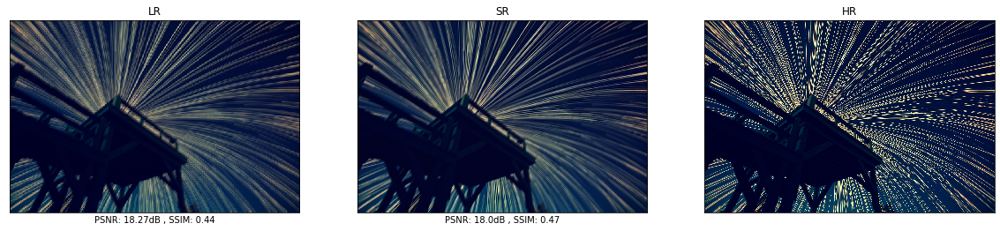

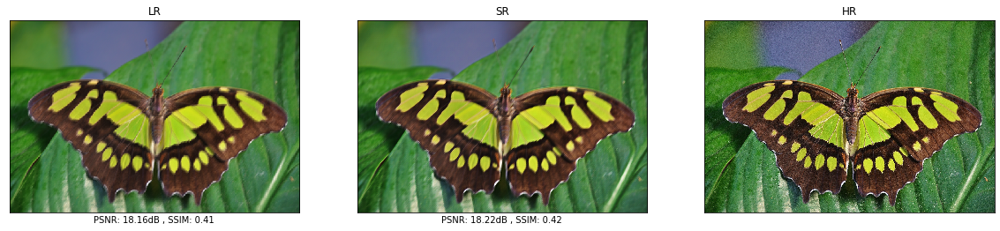

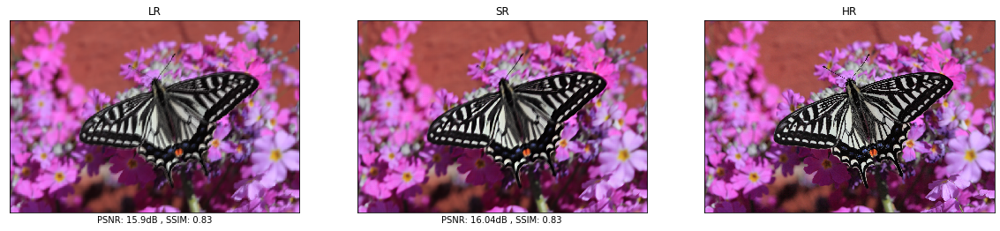

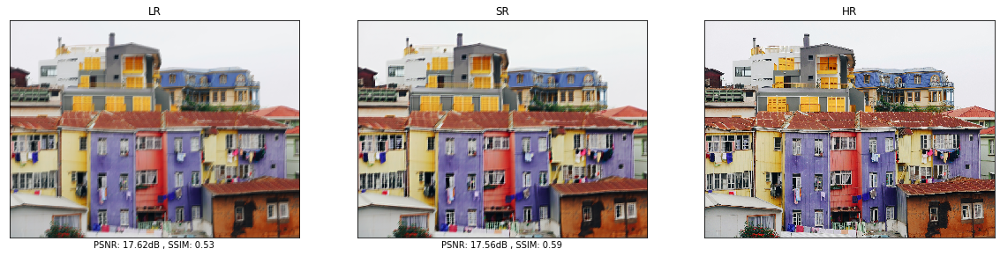

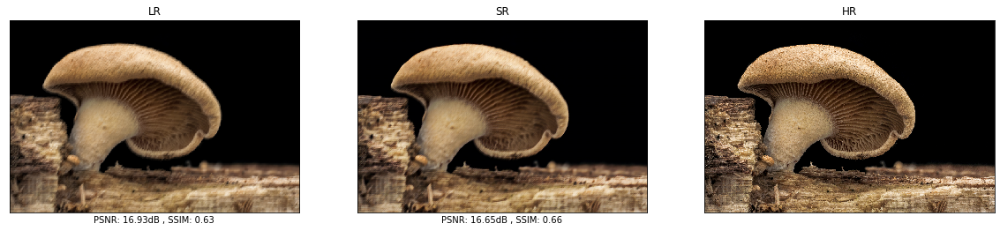

...

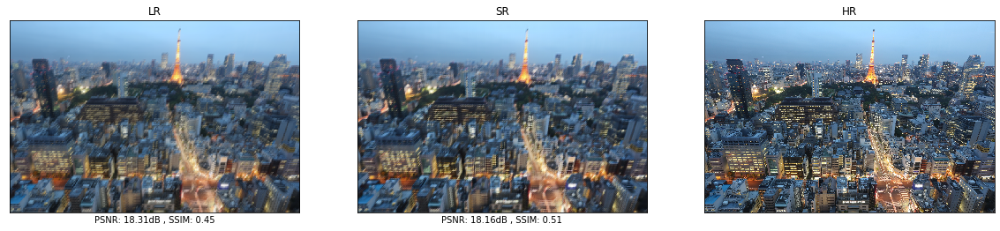

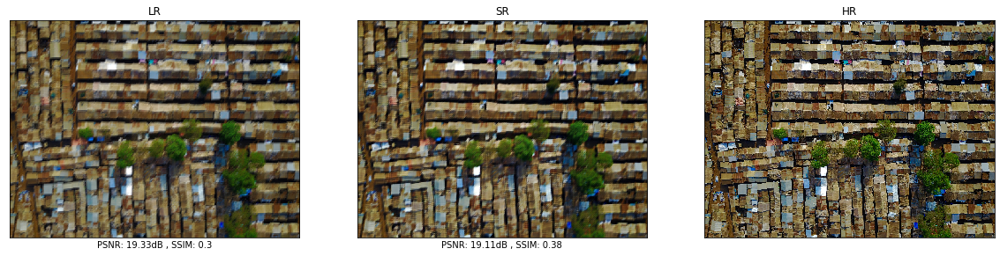

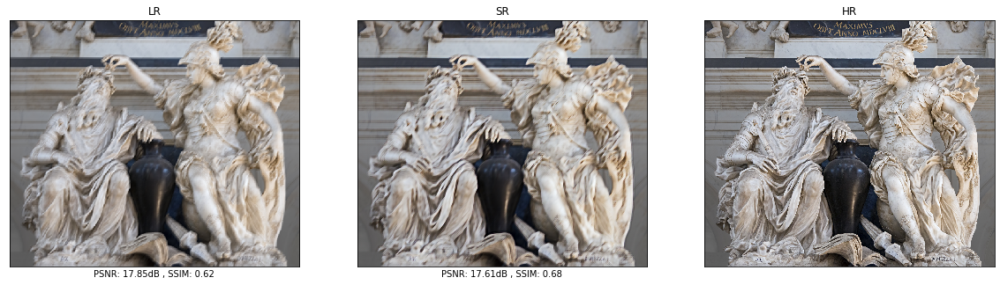

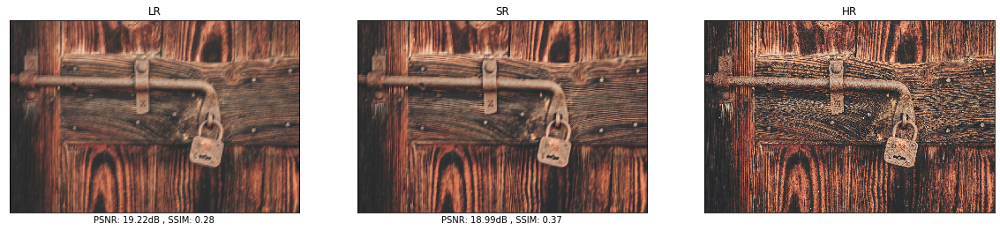

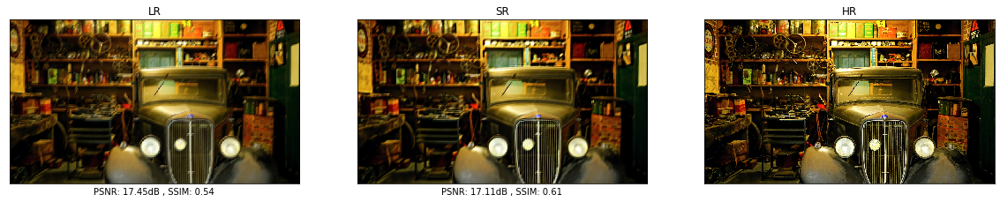

In [0]:
for imgnum in images:
  compare_images(cnnTrainer.model,'data/images/DIV2K_valid_LR_unknown/X4/0'+str(imgnum)+'x4.png','data/images/DIV2K_valid_HR/0'+str(imgnum)+'.png',imgnum,mtype)

(339, 510, 3)
(1, 339, 510, 3)
(1356, 2040, 3)


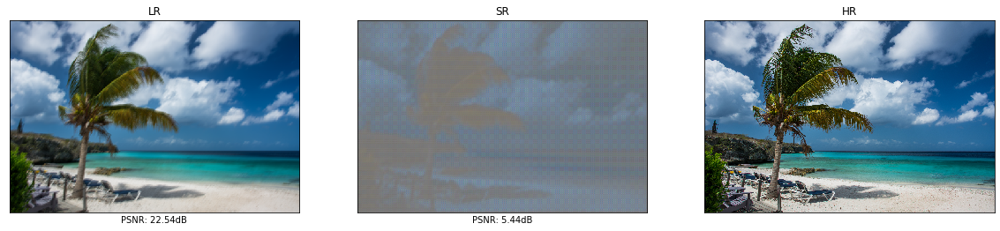

In [0]:
compare_images(cnnTrainer.model,'data/images/DIV2K_valid_LR_unknown/X4/0806x4.png','data/images/DIV2K_valid_HR/0806.png')

In [0]:
files.download('SR.png')
files.download('LR.png')
files.download('HR.png')
files.download('LR-UP.png')

(411, 510, 3)
(1, 411, 510, 3)
(1644, 2040, 3)


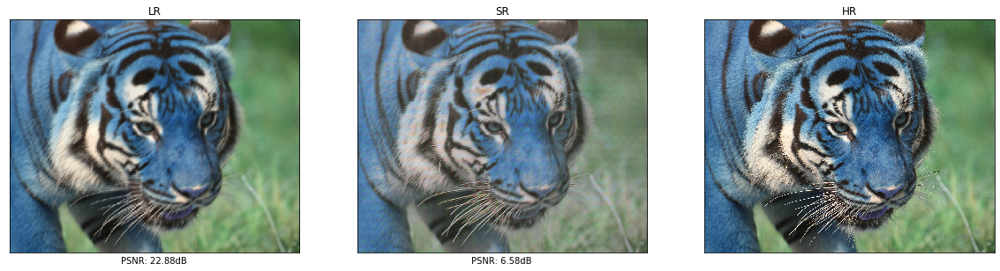

In [0]:
compare_images(cnnTrainer.model,'data/images/DIV2K_train_LR_unknown/X4/0010x4.png','data/images/DIV2K_train_HR/0010.png')

In [0]:
from google.colab import files
files.download('SR.png')
files.download('LR.png')
files.download('HR.png')
files.download('LR-UP.png')

(384, 510, 3)
(1, 384, 510, 3)
(1536, 2040, 3)


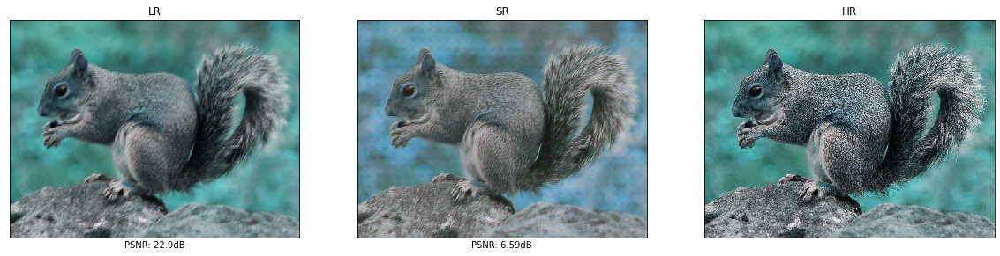

In [0]:
compare_images(cnnTrainer.model,'data/images/DIV2K_valid_LR_unknown/X4/0810x4.png','data/images/DIV2K_valid_HR/0810.png')

# Pre Output

In [0]:
pre_generator = generator()
pre_generator.load_weights('pre_generator.h5')

(411, 510, 3)
(1, 411, 510, 3)
(1644, 2040, 3)


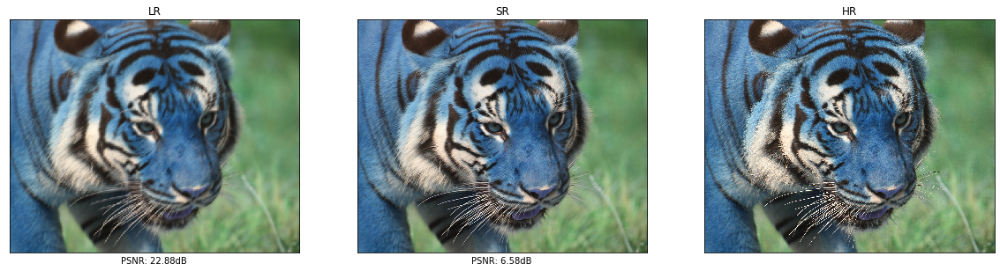

In [0]:
compare_images(pre_generator,'data/images/DIV2K_train_LR_unknown/X4/0010x4.png','data/images/DIV2K_train_HR/0010.png')

In [0]:
from google.colab import files
files.download('SR.png')
files.download('LR.png')
files.download('HR.png')
files.download('LR-UP.png')

(339, 510, 3)
(1, 339, 510, 3)
(1356, 2040, 3)


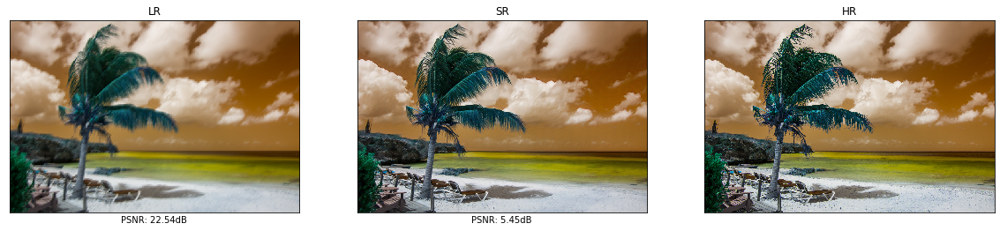

In [0]:
compare_images(pre_generator,'data/images/DIV2K_valid_LR_unknown/X4/0806x4.png','data/images/DIV2K_valid_HR/0806.png')

In [0]:
from google.colab import files
files.download('SR.png')
files.download('LR.png')
files.download('HR.png')
files.download('LR-UP.png')

In [0]:
!cp *.h5 gdrive/My\ Drive/SR/GAN